# Advances Lane Lines
## Camera Calibration

In [1]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import pickle
%matplotlib qt

In [2]:
# The code for camera calibration is adapted from the Udacity Nanodegree material 
# (https://github.com/udacity/CarND-Camera-Calibration)

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9, 0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('camera_cal/calibration*.jpg')

# Step through the list and search for chessboard corners
for idx, fname in enumerate(images):
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6), None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        cv2.drawChessboardCorners(img, (9,6), corners, ret)
        #write_name = 'corners_found'+str(idx)+'.jpg'
        #cv2.imwrite(write_name, img)
        cv2.imshow('img', img)
        cv2.imwrite(f'output_images/calibration_{idx}.jpg', img)
        # cv2.waitKey(500)

cv2.destroyAllWindows()

Text(0.5, 1.0, 'Undistorted Image')

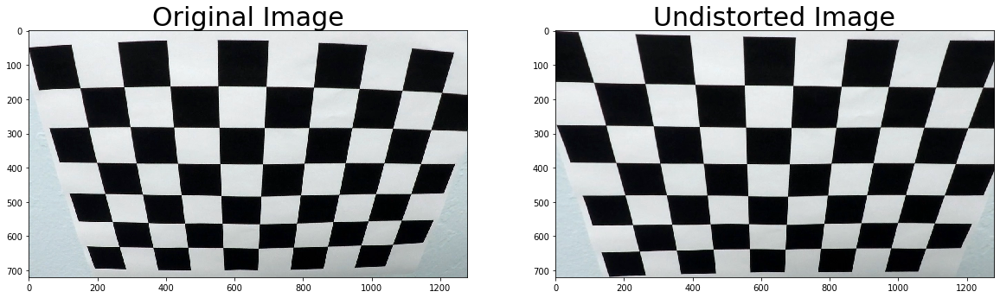

In [3]:
%matplotlib inline
# Test undistortion on an image
img = cv2.imread('camera_cal/calibration2.jpg')
img_size = (img.shape[1], img.shape[0])

# Do camera calibration given object points and image points
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size, None, None)

dst = cv2.undistort(img, mtx, dist, None, mtx)
cv2.imwrite('output_images/calibration2_undist.jpg', dst)

# Save the camera calibration result for later use (we won't worry about rvecs / tvecs)
dist_pickle = {}
dist_pickle["mtx"] = mtx
dist_pickle["dist"] = dist
pickle.dump(dist_pickle, open("camera_cal/wide_dist_pickle.p", "wb"))
#dst = cv2.cvtColor(dst, cv2.COLOR_BGR2RGB)
# Visualize undistortion
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(dst)
ax2.set_title('Undistorted Image', fontsize=30)

## Pipeline (test images)
### Step-by-Step

In [4]:
# Read in the saved camera matrix and distortion coefficients
dist_pickle = pickle.load(open("camera_cal/wide_dist_pickle.p", "rb"))
mtx = dist_pickle["mtx"]
dist = dist_pickle["dist"]

In [5]:
def undistort_img(img, mtx, dist):
    """Undistort image"""
    dst = cv2.undistort(img, mtx, dist, None, mtx)
    return dst

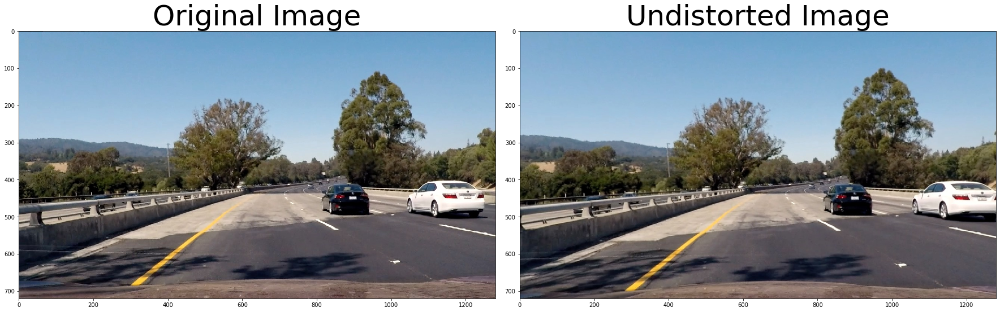

In [6]:
img = cv2.imread('test_images/test4.jpg')
dst = undistort_img(img, mtx, dist)

# BGR to RGB
img = img[:,:,::-1]
dst = dst[:,:,::-1]

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(dst)
ax2.set_title('Undistorted Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

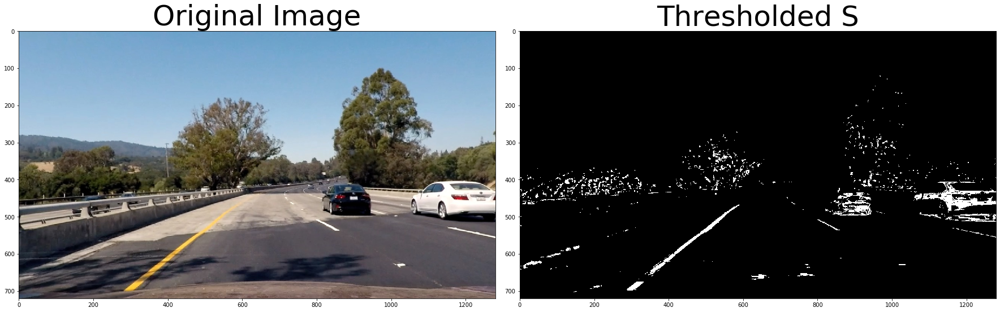

In [7]:
img = cv2.imread('test_images/test4.jpg')
img = undistort_img(img, mtx, dist)

# Function that thresholds the S-channel of HLS
def hls_select(img, hls_thresh=(0, 255)):
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    s_channel = hls[:,:,2]
    binary_output = np.zeros_like(s_channel)
    binary_output[(s_channel > hls_thresh[0]) & (s_channel <= hls_thresh[1])] = 1
    return binary_output
    
# Tuned threshold to get the lane lines  
hls_binary = hls_select(img, hls_thresh=(160, 255))

# BGR to RGB
img = img[:,:,::-1]

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(hls_binary, cmap='gray')
ax2.set_title('Thresholded S', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

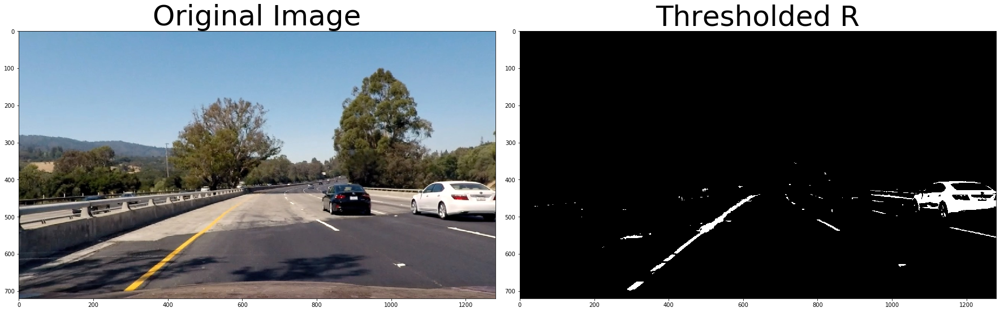

In [8]:
img = cv2.imread('test_images/test4.jpg')
img = undistort_img(img, mtx, dist)

# Function that thresholds the R-channel of RGB
def r_select(img, r_thresh=(0, 255)):
    r_channel = img[:,:,2]
    binary_output = np.zeros_like(r_channel)
    binary_output[(r_channel > r_thresh[0]) & (r_channel <= r_thresh[1])] = 1
    return binary_output
    
# Tuned threshold to get the lane lines  
r_binary = r_select(img, r_thresh=(220, 255))

# BGR to RGB
img = img[:,:,::-1]

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(r_binary, cmap='gray')
ax2.set_title('Thresholded R', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

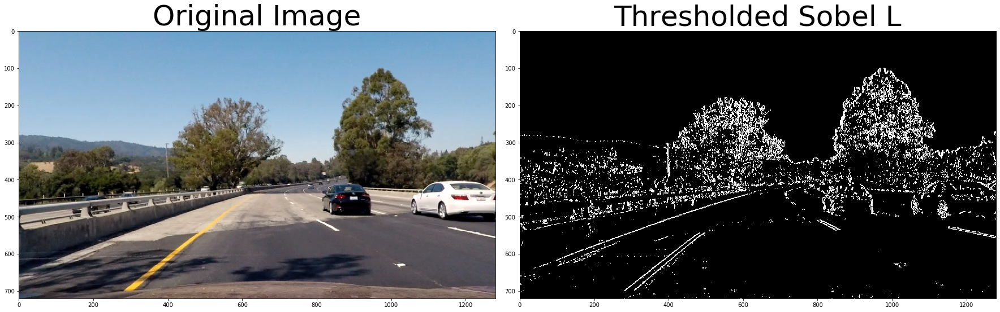

In [9]:
img = cv2.imread('test_images/test4.jpg')
img = undistort_img(img, mtx, dist)

def sobel_l(img, sx_thresh=(20, 100)):
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    l_channel = hls[:,:,1]
    
    # Sobel x
    sobelx = cv2.Sobel(l_channel, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    
    # Threshold x gradient
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= sx_thresh[0]) & (scaled_sobel <= sx_thresh[1])] = 1
    
    return sxbinary

# Tuned threshold to get the lane lines  
sobel_binary = sobel_l(img, sx_thresh=(20, 100))

# BGR to RGB
img = img[:,:,::-1]

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(sobel_binary, cmap='gray')
ax2.set_title('Thresholded Sobel L', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

(720, 1280, 3)


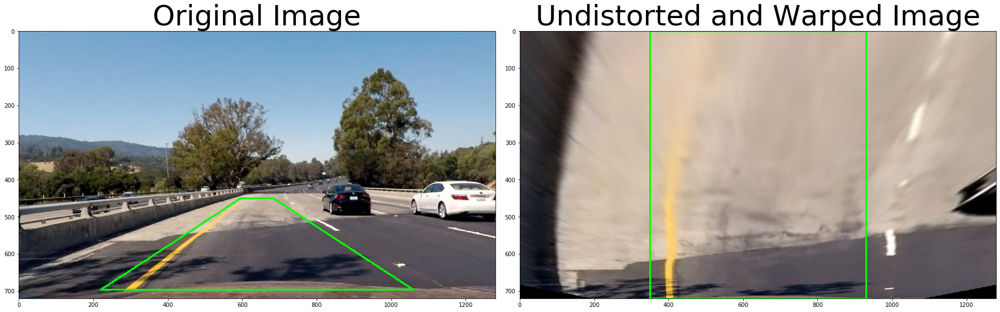

In [10]:
img = cv2.imread('test_images/test4.jpg')
img = undistort_img(img, mtx, dist)

def warp_image(img):
    imshape = img.shape
    # We assume the camera is mounted at the center of the car
    y_offset = imshape[0] / 8
    x_offset_top = imshape[1] / 29
    x_offset_bottom = imshape[1] / 5.8
    y_offset_bottom = imshape[0] // 30

    src = np.array([[(imshape[1] / 2 - x_offset_top, imshape[0] / 2 + y_offset),  # top left
                     (imshape[1] / 2 + x_offset_top, imshape[0] / 2 + y_offset),  # top right
                     (imshape[1] - x_offset_bottom, imshape[0] - y_offset_bottom),  # bottom right
                     (x_offset_bottom, imshape[0] - y_offset_bottom)  # bottom left
                    ]], dtype=np.float32)

    offset = 350
    dst = np.float32([[offset, 0],   # x, y
                      [imshape[1] - offset, 0],
                      [imshape[1] - offset, imshape[0]],
                      [offset, imshape[0]]])

    # use cv2.getPerspectiveTransform() to get M, the transform matrix
    M = cv2.getPerspectiveTransform(src, dst)

    # use cv2.warpPerspective() to warp your image to a top-down view
    warped = cv2.warpPerspective(img, M, (imshape[1], imshape[0]), flags=cv2.INTER_LINEAR)

    return np.array(warped), M

top_down, perspective_M = warp_image(img)

# BGR to RGB
img = img[:,:,::-1]
top_down = top_down[:,:,::-1]

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

# visualize the lines in the original image
imshape = img.shape
print(imshape)
# We assume the camera is mounted at the center of the car
y_offset = imshape[0] / 8
x_offset_top = imshape[1] / 29
x_offset_bottom = imshape[1] / 5.8
y_offset_bottom = imshape[0] // 30

color = (0, 255, 0)
thickness = 3
startpoint = (int(imshape[1] / 2 - x_offset_top), int(imshape[0] / 2 + y_offset))  # top left
endpoint = (int(imshape[1] / 2 + x_offset_top), int(imshape[0] / 2 + y_offset))  # top right
img = cv2.line(img, startpoint, endpoint, color, thickness).get()

startpoint = (int(imshape[1] / 2 + x_offset_top), int(imshape[0] / 2 + y_offset))  # top right
endpoint = (int(imshape[1] - x_offset_bottom), int(imshape[0] - y_offset_bottom))  # bottom right
img = cv2.line(img, startpoint, endpoint, color, thickness)

startpoint = (int(imshape[1] - x_offset_bottom), int(imshape[0] - y_offset_bottom))  # bottom right
endpoint = (int(x_offset_bottom), int(imshape[0] - y_offset_bottom))  # bottom left
img = cv2.line(img, startpoint, endpoint, color, thickness)

startpoint = (int(x_offset_bottom), int(imshape[0] - y_offset_bottom))  # bottom left
endpoint = (int(imshape[1] / 2 - x_offset_top), int(imshape[0] / 2 + y_offset))  # top left
img = cv2.line(img, startpoint, endpoint, color, thickness)

ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)

# visualize the lines on the warped image
offset = 350

startpoint = (int(offset), int(0))  # top left
endpoint = (int(imshape[1] - offset), int(0))  # top right
top_down = cv2.line(top_down, startpoint, endpoint, color, thickness).get()

startpoint = (int(imshape[1] - offset), int(0))  # top right
endpoint = (int(imshape[1] - offset), int(imshape[0]))  # bottom right
top_down = cv2.line(top_down, startpoint, endpoint, color, thickness)

startpoint = (int(imshape[1] - offset), int(imshape[0]))  # bottom right
endpoint = (int(offset), int(imshape[0]))  # bottom left
top_down = cv2.line(top_down, startpoint, endpoint, color, thickness)

startpoint = (int(offset), int(imshape[0]))  # bottom left
endpoint = (int(offset), int(0))  # top left
top_down = cv2.line(top_down, startpoint, endpoint, color, thickness)

ax2.imshow(top_down)
ax2.set_title('Undistorted and Warped Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

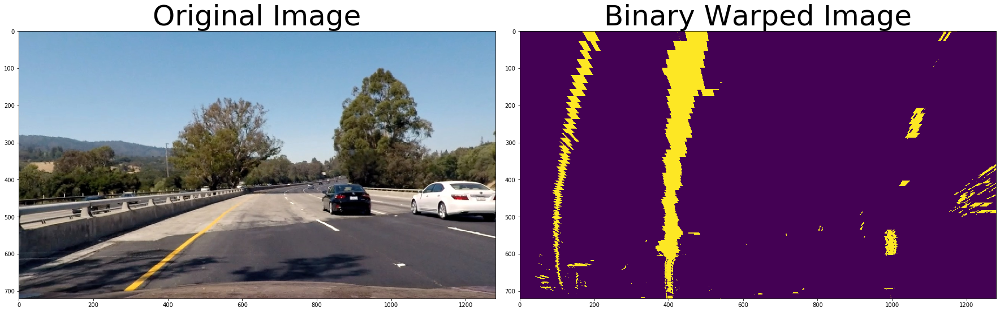

In [11]:
img = cv2.imread('test_images/test4.jpg')
img = undistort_img(img, mtx, dist)

def get_binary_warped_image(img):
    hls_thresh = (160, 255)
    r_thresh = (220, 255)
    sx_thresh = (20, 100)

    hls_binary = hls_select(img, hls_thresh=hls_thresh)
    r_binary = r_select(img, r_thresh=r_thresh)
    sobel_binary = sobel_l(img, sx_thresh=sx_thresh)

    # Stack each channel
    color_binary = np.dstack((hls_binary, r_binary, sobel_binary)) * 255

    # Warp perspective
    warped_image, _ = warp_image(color_binary)
    warped_binary = ((warped_image[:,:,0] == 255) | (warped_image[:,:,1] == 255) | (warped_image[:,:,2] == 255))
    warped_binary = warped_binary.astype(np.int32)
    
    return warped_binary

warped_binary = get_binary_warped_image(img)

# BGR to RGB
img = img[:,:,::-1]

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(warped_binary)
ax2.set_title('Binary Warped Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

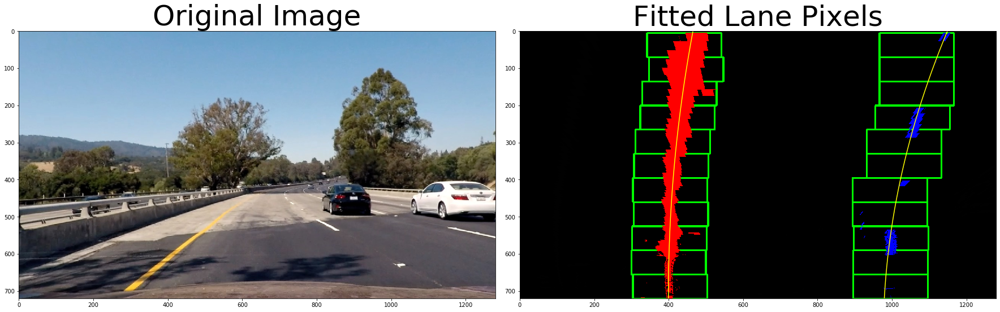

In [12]:
def find_lane_pixels(binary_warped):
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # HYPERPARAMETERS
    # Choose the number of sliding windows
    nwindows = 11
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 100

    # Set height of windows - based on nwindows above and image shape
    window_height = np.int(binary_warped.shape[0]//nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        
        # Draw the windows on the visualization image
        cv2.rectangle(out_img, (win_xleft_low,win_y_low), (win_xleft_high,win_y_high), (0, 255, 0), 3)
        cv2.rectangle(out_img, (win_xright_low,win_y_low), (win_xright_high,win_y_high), (0, 255, 0), 3)
        
        # Identify the nonzero pixels in x and y within the window #
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    return leftx, lefty, rightx, righty, out_img


def fit_polynomial(binary_warped):
    # Find our lane pixels first
    leftx, lefty, rightx, righty, out_img = find_lane_pixels(binary_warped)
    # Fit a second order polynomial to each using `np.polyfit`
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    ## Visualization ##
    # Colors in the left and right lane regions
    out_img[lefty, leftx] = [255, 0, 0]
    out_img[righty, rightx] = [0, 0, 255]

    return out_img, left_fit, right_fit


img = cv2.imread('test_images/test4.jpg')
img = undistort_img(img, mtx, dist)

warped_binary = get_binary_warped_image(img)

out_img, left_fit, right_fit = fit_polynomial(warped_binary)

# BGR to RGB
img = img[:,:,::-1]

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(out_img)
ax2.set_title('Fitted Lane Pixels', fontsize=50)

# Generate x and y values for plotting
ploty = np.linspace(0, out_img.shape[0]-1, out_img.shape[0] )
try:
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
except TypeError:
    # Avoids an error if `left` and `right_fit` are still none or incorrect
    print('The function failed to fit a line!')
    left_fitx = 1*ploty**2 + 1*ploty
    right_fitx = 1*ploty**2 + 1*ploty
# Plots the left and right polynomials on the lane lines
ax2.plot(left_fitx, ploty, color='yellow')
ax2.plot(right_fitx, ploty, color='yellow')

plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [13]:
# show left_fit second order polynominal parameters
left_fit

array([ 1.31486609e-04, -1.85989030e-01,  4.65260092e+02])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


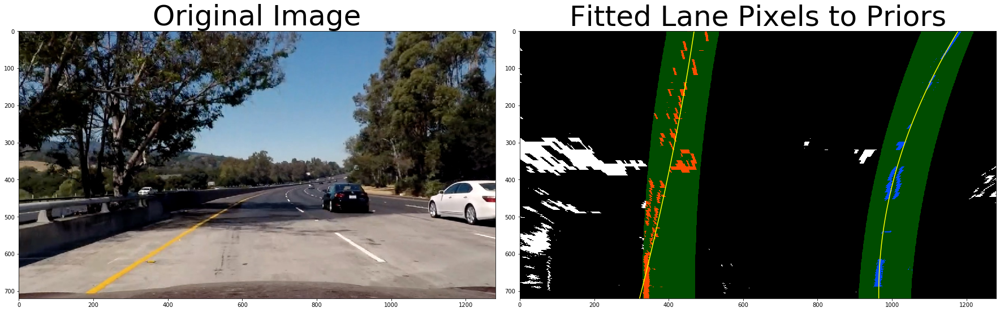

In [14]:
# Load our image - this should be a new frame since last time!
img = cv2.imread('test_images/test5.jpg')
img = undistort_img(img, mtx, dist)

warped_binary = get_binary_warped_image(img)

# Polynomial fit values from the previous frame
# left_fit, right_fit


def fit_poly(img_shape, leftx, lefty, rightx, righty):
    ### Fit a second order polynomial to each with np.polyfit() ###
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
  
    return left_fit, right_fit


def search_around_poly(binary_warped, left_fit, right_fit):
    # Choose the width of the margin around the previous polynomial to search
    margin = 70

    # Grab activated pixels
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    ### Set the area of search based on activated x-values ###
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
                    left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
                    left_fit[1]*nonzeroy + left_fit[2] + margin)))
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
                    right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
                    right_fit[1]*nonzeroy + right_fit[2] + margin)))
    
    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    # Fit new polynomials
    left_fit, right_fit = fit_poly(binary_warped.shape, leftx, lefty, rightx, righty)
    
    ## Visualization ##
    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    window_img = np.zeros_like(out_img)
    # Color in left and right line pixels
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                              ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                              ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    
    return result, left_fit, right_fit


# Run image through the pipeline
out_img, left_fit, right_fit = search_around_poly(warped_binary, left_fit, right_fit)

# BGR to RGB
img = img[:,:,::-1]

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(out_img)
ax2.set_title('Fitted Lane Pixels to Priors', fontsize=50)

# Generate x and y values for plotting
ploty = np.linspace(0, out_img.shape[0]-1, out_img.shape[0] )
try:
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
except TypeError:
    # Avoids an error if `left` and `right_fit` are still none or incorrect
    print('The function failed to fit a line!')
    left_fitx = 1*ploty**2 + 1*ploty
    right_fitx = 1*ploty**2 + 1*ploty
# Plots the left and right polynomials on the lane lines
ax2.plot(left_fitx, ploty, color='yellow')
ax2.plot(right_fitx, ploty, color='yellow')

plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

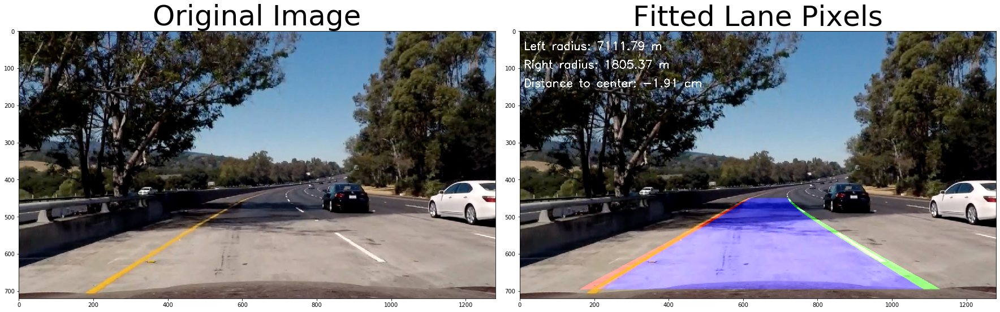

In [15]:
def measure_curvature_real(ploty, left_fit, right_fit):
    '''
    Calculates the curvature of polynomial functions in meters.
    '''
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 28/720  # meters per pixel in y dimension
    xm_per_pix = 3.7/580  # meters per pixel in x dimension
    
    # Start by generating our fake example data
    # Make sure to feed in your real data instead in your project!
    # ploty, left_fit_cr, right_fit_cr = generate_data(ym_per_pix, xm_per_pix)
    
    # Define y-value where we want radius of curvature
    # We'll choose the maximum y-value, corresponding to the bottom of the image
    y_eval = np.max(ploty)
    
    # Calculation of R_curve (radius of curvature)
    left_curverad = ((1 + (2*left_fit[0]*y_eval*ym_per_pix + left_fit[1])**2)**1.5) / np.absolute(2*left_fit[0])
    right_curverad = ((1 + (2*right_fit[0]*y_eval*ym_per_pix + right_fit[1])**2)**1.5) / np.absolute(2*right_fit[0])
    
    return left_curverad, right_curverad


# Calculate the radius of curvature in meters for both lane lines
left_curverad, right_curverad = measure_curvature_real(ploty, left_fit, right_fit)

# print(left_curverad, 'm', right_curverad, 'm')

# transform back the lane lines to the original (undistorted) image
def unwarp_lane_lines(img, left_fit, right_fit):
    imshape = img.shape
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, imshape[0]-1, imshape[0] )
    try:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        print('The function failed to fit a line!')
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty
    
    # We assume the camera is mounted at the center of the car
    y_offset = imshape[0] / 8
    x_offset_top = imshape[1] / 29
    x_offset_bottom = imshape[1] / 5.8
    y_offset_bottom = imshape[0] // 30
    
    src = np.array([[(imshape[1] / 2 - x_offset_top, imshape[0] / 2 + y_offset),  # top left
                     (imshape[1] / 2 + x_offset_top, imshape[0] / 2 + y_offset),  # top right
                     (imshape[1] - x_offset_bottom, imshape[0] - y_offset_bottom),  # bottom right
                     (x_offset_bottom, imshape[0] - y_offset_bottom)  # bottom left
                    ]], dtype=np.float32)  

    offset = 350
    dst = np.float32([[offset, 0],   # x, y
                      [imshape[1] - offset, 0],
                      [imshape[1] - offset, imshape[0]],
                      [offset, imshape[0]]])

    # use cv2.getPerspectiveTransform() to get M, the transform matrix
    M = cv2.getPerspectiveTransform(dst, src)
    
    lanes_img = np.zeros_like(img)
    
    y_values = np.array(ploty)
    left = np.vstack((left_fitx, y_values)).T.astype(np.int32)
    right = np.vstack((right_fitx, y_values)).T.astype(np.int32)
    
    color_left = (255, 0, 0)
    color_right = (0, 255, 0)
    color_road = (0, 0, 255)
    thickness = 30

    left_and_right = np.vstack((left[::-1], right))

    cv2.fillPoly(lanes_img, [left_and_right], color_road)
    
    cv2.polylines(lanes_img, [left], False, color_left, thickness, lineType=cv2.LINE_AA)
    cv2.polylines(lanes_img, [right], False, color_right, thickness, lineType=cv2.LINE_AA)
    
    # use cv2.warpPerspective() to warp your image from a top-down view back to normal view
    lanes_img = cv2.warpPerspective(lanes_img, M, (imshape[1], imshape[0]), flags=cv2.INTER_LINEAR)

    return lanes_img


img_draw = img.copy()

def add_text_to_image(img_draw, left_curverad, right_curverad, left_fit, right_fit):
    imshape = img_draw.shape
    # Add curvature info to the picture

    font                   = cv2.FONT_HERSHEY_SIMPLEX
    bottomLeftCornerOfText = (10,50)
    fontScale              = 1
    fontColor              = (255, 255, 255)
    lineType               = 2
    text_to_add = f'Left radius: {left_curverad:.2f} m'

    cv2.putText(img_draw,
        text_to_add,
        bottomLeftCornerOfText,
        font,
        fontScale,
        fontColor,
        lineType)

    font                   = cv2.FONT_HERSHEY_SIMPLEX
    bottomLeftCornerOfText = (10, 100)
    fontScale              = 1
    fontColor              = (255, 255, 255)
    lineType               = 2
    text_to_add = f'Right radius: {right_curverad:.2f} m'

    cv2.putText(img_draw,
        text_to_add,
        bottomLeftCornerOfText,
        font,
        fontScale,
        fontColor,
        lineType)

    # Add position info to the picture
    # Lane width is 3.70 m and the road is transformed to a 580 pixels in width
    # that means, each pixel is 3.70 / 580 m 

    meter_per_pixel = 3.70 / 580
    cm_per_pixel = meter_per_pixel * 100

    # We assume the camera is mounted at the center of the car
    # thus, the position of the car is in the center of the image
    pos_vehicle = imshape[1] / 2
    
    # the center of the road
    try:
        left_fitx = left_fit[0]*(imshape[0]-1)**2 + left_fit[1]*(imshape[0]-1) + left_fit[2]
        right_fitx = right_fit[0]*(imshape[0]-1)**2 + right_fit[1]*(imshape[0]-1) + right_fit[2]
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        print('The function failed to fit a line!')
        left_fitx = 1*(imshape[0]-1)**2 + 1*(imshape[0]-1)
        right_fitx = 1*(imshape[0]-1)**2 + 1*(imshape[0]-1)
        
    road_center = (left_fitx + right_fitx) // 2

    distance_to_center = (pos_vehicle - road_center) * cm_per_pixel

    font                   = cv2.FONT_HERSHEY_SIMPLEX
    bottomLeftCornerOfText = (10, 150)
    fontScale              = 1
    fontColor              = (255, 255, 255)
    lineType               = 2
    text_to_add = f'Distance to center: {distance_to_center:.2f} cm'

    cv2.putText(img_draw,
        text_to_add,
        bottomLeftCornerOfText,
        font,
        fontScale,
        fontColor,
        lineType)
    
    return img_draw

img_draw = add_text_to_image(img_draw, left_curverad, right_curverad, left_fit, right_fit)

lanes_img = unwarp_lane_lines(img_draw, left_fit, right_fit)

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)

result = cv2.addWeighted(img_draw, 1, lanes_img, 0.5, 0)

ax2.imshow(result)
ax2.set_title('Fitted Lane Pixels', fontsize=50)

plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

### Putting everthing together for a full pipeline

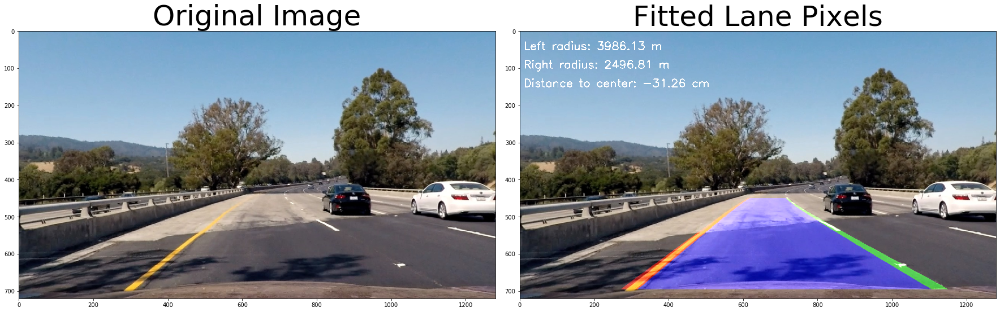

In [16]:
img = cv2.imread('test_images/test4.jpg')

def pipeline(img):
    img = undistort_img(img, mtx, dist)
    warped_binary = get_binary_warped_image(img)
    out_img, left_fit, right_fit = fit_polynomial(warped_binary)

    # Calculate the radius of curvature in meters for both lane lines
    left_curverad, right_curverad = measure_curvature_real(ploty, left_fit, right_fit)    
    
    # BGR to RGB
    img = img[:,:,::-1]
    
    img_draw = img.copy()
    
    img_draw = add_text_to_image(img_draw, left_curverad, right_curverad, left_fit, right_fit)
    lanes_img = unwarp_lane_lines(img_draw, left_fit, right_fit)
    
    result = cv2.addWeighted(img_draw, 1, lanes_img, 0.5, 0)
    
    return img, result

img, result = pipeline(img)

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(result)
ax2.set_title('Fitted Lane Pixels', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

### Apply to all test images

['straight_lines1.jpg', 'straight_lines2.jpg', 'test1.jpg', 'test2.jpg', 'test3.jpg', 'test4.jpg', 'test5.jpg', 'test6.jpg']


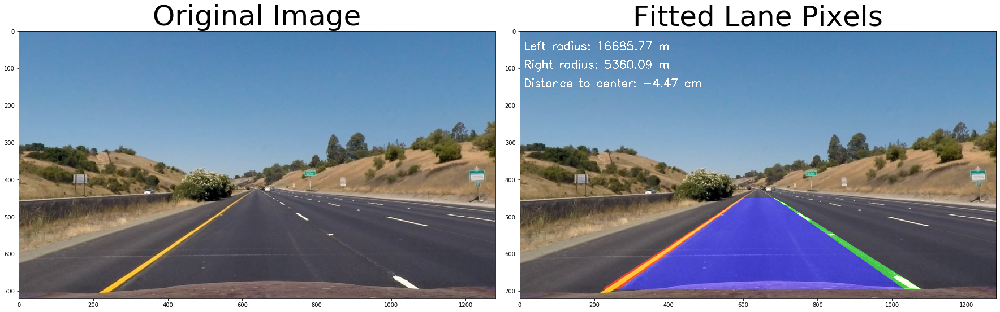

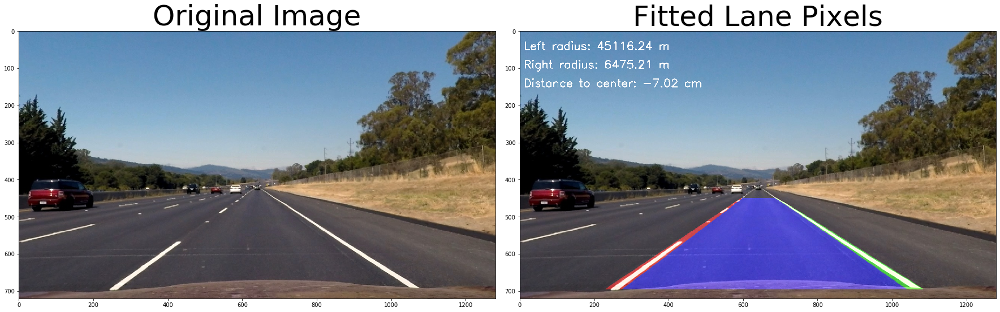

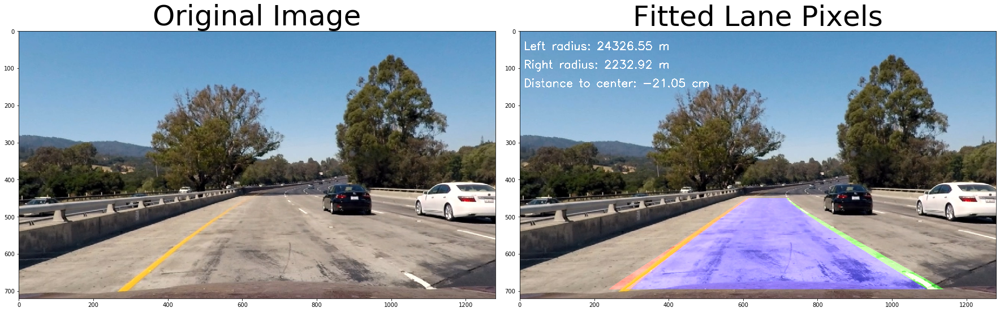

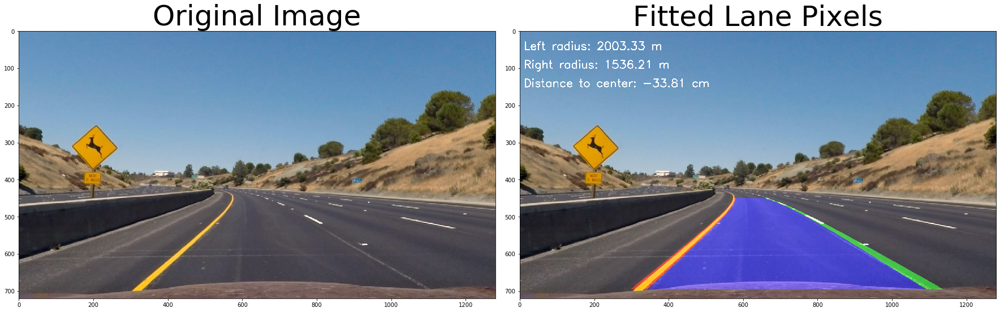

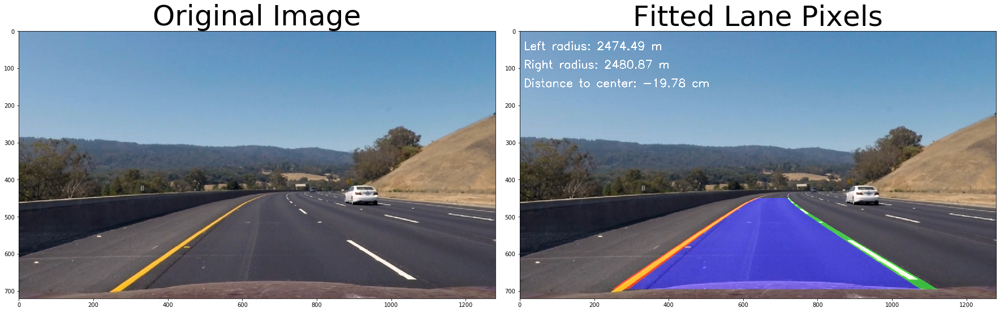

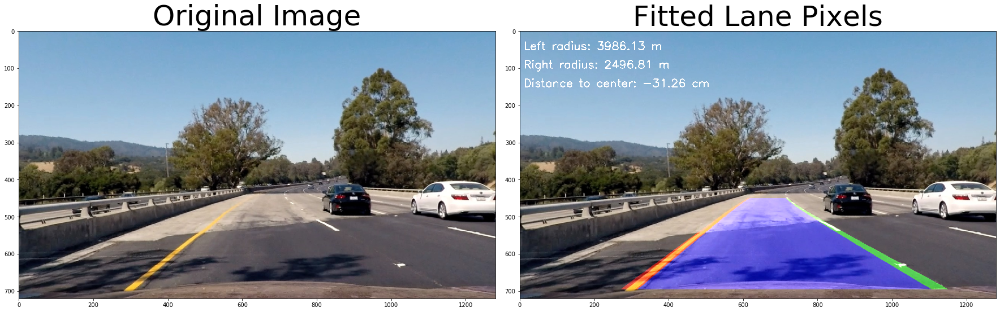

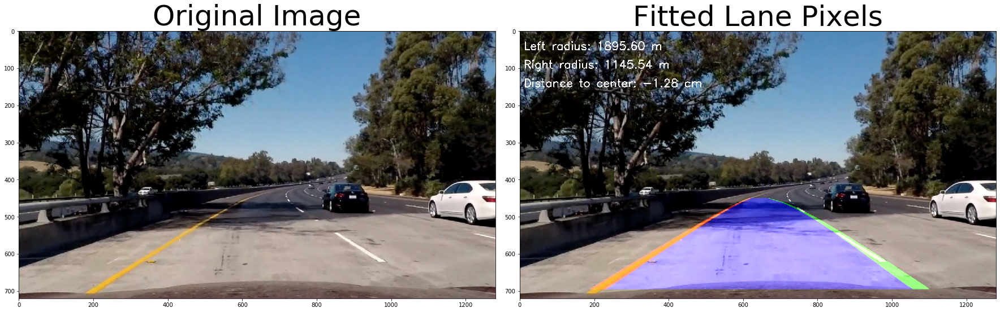

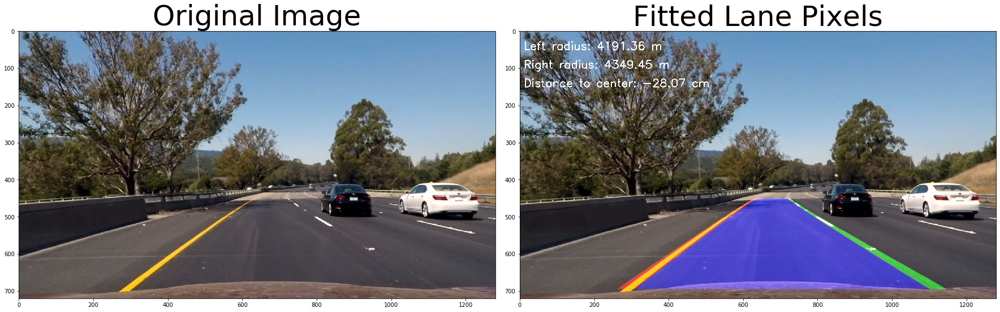

In [17]:
import os
path = "test_images/"
static_images = os.listdir(path)
print(static_images)

for idx, image in enumerate(static_images):
    img = cv2.imread(f'test_images/{image}')
    img, result = pipeline(img)
    
    # Plot the result
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(img)
    ax1.set_title('Original Image', fontsize=50)
    ax2.imshow(result)
    ax2.set_title('Fitted Lane Pixels', fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    plt.savefig(f'output_images/pipeline_test_image{idx}.jpg')

## Pipeline (Video)

In [18]:
class Pipeline:
    """ lane_state """
    def __init__(self):
        self.left_fit = np.zeros((7,3))
        self.right_fit = np.zeros((7,3))
        self.confidence = 0
        self.initialized = 0
    
    def __call__(self, img):
        img = undistort_img(img, mtx, dist)
        warped_binary = get_binary_warped_image(img)
        
        if (len(self.left_fit) > 0) and (len(self.right_fit) > 0) and self.initialized >= 7:
            out_img, left_fit, right_fit = search_around_poly(warped_binary, self.left_fit[0], self.right_fit[0])
            self.average_push_new_fit(left_fit, right_fit)
        else:
            out_img, left_fit, right_fit = fit_polynomial(warped_binary)
            self.average_push_new_fit(left_fit, right_fit)

        # Calculate the radius of curvature in meters for both lane lines
        left_curverad, right_curverad = measure_curvature_real(ploty, self.left_fit[0], self.right_fit[0])    

        # BGR to RGB
        # img = img[:,:,::-1]

        img_draw = img.copy()

        img_draw = add_text_to_image(img_draw, left_curverad, right_curverad, self.left_fit[0], self.right_fit[0])
        lanes_img = unwarp_lane_lines(img_draw, self.left_fit[0], self.right_fit[0])

        result = cv2.addWeighted(img_draw, 1, lanes_img, 0.5, 0)

        return result
    
    def average_push_new_fit(self, left_fit, right_fit):
        self.left_fit = np.roll(self.left_fit, 1, axis=0)
        self.right_fit = np.roll(self.right_fit, 1, axis=0)
        
        self.left_fit[0] = left_fit
        self.right_fit[0] = right_fit
        
        if self.initialized >= 7:
            self.left_fit[0] = ((0.4 * self.left_fit[0])
                               + (0.2 * self.left_fit[1])
                               + (0.1 * self.left_fit[2])
                               + (0.075 * self.left_fit[3])
                               + (0.075 * self.left_fit[4])
                               + (0.075 * self.left_fit[5])
                               + (0.075 * self.left_fit[6]))
            self.right_fit[0] = ((0.4 * self.right_fit[0])
                               + (0.2 * self.right_fit[1])
                               + (0.1 * self.right_fit[2])
                               + (0.075 * self.right_fit[3])
                               + (0.075 * self.right_fit[4])
                               + (0.075 * self.right_fit[5])
                               + (0.075 * self.right_fit[6]))
        self.initialized += 1

In [19]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [20]:
video_output = 'output_videos/project_video.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,5)
clip1 = VideoFileClip("project_video.mp4")
video_clip = clip1.fl_image(Pipeline()) # NOTE: this function expects color images!!
%time video_clip.write_videofile(video_output, audio=False)

t:   0%|                                                                            | 0/1260 [00:00<?, ?it/s, now=None]

Moviepy - Building video output_videos/project_video.mp4.
Moviepy - Writing video output_videos/project_video.mp4



Moviepy - Done !
Moviepy - video ready output_videos/project_video.mp4
Wall time: 3min 26s


In [21]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(video_output))

In [22]:
# video_output = 'output_videos/challenge_video.mp4'
# ## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
# ## To do so add .subclip(start_second,end_second) to the end of the line below
# ## Where start_second and end_second are integer values representing the start and end of the subclip
# ## You may also uncomment the following line for a subclip of the first 5 seconds
# ##clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,5)
# clip1 = VideoFileClip("challenge_video.mp4")
# video_clip = clip1.fl_image(Pipeline()) # NOTE: this function expects color images!!
# %time video_clip.write_videofile(video_output, audio=False)

In [23]:
# HTML("""
# <video width="960" height="540" controls>
#   <source src="{0}">
# </video>
# """.format(video_output))

In [24]:
# video_output = 'output_videos/harder_challenge_video.mp4'
# ## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
# ## To do so add .subclip(start_second,end_second) to the end of the line below
# ## Where start_second and end_second are integer values representing the start and end of the subclip
# ## You may also uncomment the following line for a subclip of the first 5 seconds
# ##clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,5)
# clip1 = VideoFileClip("harder_challenge_video.mp4")
# video_clip = clip1.fl_image(Pipeline()) # NOTE: this function expects color images!!
# %time video_clip.write_videofile(video_output, audio=False)

In [25]:
# HTML("""
# <video width="960" height="540" controls>
#   <source src="{0}">
# </video>
# """.format(video_output))